
# ML Project: Tabular Data Classification with Explainability

This notebook combines the entire machine learning pipeline into one cohesive structure:
- Exploratory Data Analysis (EDA)
- Preprocessing
- Feature Selection
- Model Training & Evaluation
- Model Explainability with LIME
- Improvements like Pipelines, Cross-validation, Hyperparameter tuning, Feature Importance, and SHAP

---


In [ ]:
!pip install opendatasets

In [ ]:
import opendatasets as od

od.download(
    "https://www.kaggle.com/datasets/crisbam/imdb-dataset-of-65k-movie-reviews-and-translation")

Dataset URL: https://www.kaggle.com/datasets/crisbam/imdb-dataset-of-65k-movie-reviews-and-translation


100%|██████████| 147M/147M [00:01<00:00, 92.0MB/s]


In [ ]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import nltk
from wordcloud import WordCloud, STOPWORDS
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from nltk.corpus import wordnet
nltk.download('stopwords')

import re
import string, unicodedata
from string import punctuation

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,f1_score
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
%%time
data = pd.read_csv("/content/imdb-dataset-of-65k-movie-reviews-and-translation/IMDB-Dataset.csv")

CPU times: user 6.95 s, sys: 1.1 s, total: 8.05 s
Wall time: 11.8 s


In [ ]:
data.shape

(150000, 4)

In [ ]:
data.head()

,Ratings,Reviews,Movies,Resenhas
0,1.0,*Disclaimer: I only watched this movie as a co...,Disaster Movie,* Isenção de responsabilidade: eu só assisti e...
1,1.0,I am writing this in hopes that this gets put ...,Disaster Movie,Estou escrevendo isso na esperança de que isso...
2,1.0,"Really, I could write a scathing review of thi...",Disaster Movie,"Realmente, eu poderia escrever uma crítica con..."
3,1.0,If you saw the other previous spoof movies by ...,Disaster Movie,Se você viu os outros filmes falsificados ante...
4,1.0,This movie I saw a day early for free and I st...,Disaster Movie,Este filme eu vi um dia cedo de graça e ainda ...


In [ ]:
len(data.Movies.unique())

14207

#DATA CLEANING - preprocessing

In [ ]:
#Customize stopword as per data

from nltk.corpus import stopwords
stop_words = stopwords.words('english')

new_stopwords = ["would","shall","could","might"]
stop_words.extend(new_stopwords)
stop_words.remove("not")

stop_words=set(stop_words)   #This line converts the stop_words list into a set. Sets are often used for stop words because they provide efficient lookup and prevent duplicate entries.

print(stop_words)

{'during', 'couldn', 'she', 'who', 'an', 'their', 'once', 'on', 'mustn', 'wouldn', 'further', 'doesn', 'ourselves', 'this', 'why', 's', 'be', 'me', 'myself', 'were', 'would', "you've", 'was', 'them', 'down', 'there', 'or', 'mightn', 'needn', 'ain', 'himself', 'they', 'because', 'should', 're', 'theirs', 'wasn', 'by', 'is', 'been', 'through', 'its', 'where', 'we', "mightn't", 'of', 'aren', 'can', "you'd", 'a', 'to', 'weren', "isn't", 'him', 've', 'doing', 'until', 'our', "shouldn't", 'he', 'again', 'no', 'up', 'didn', "weren't", 'more', 'now', 'are', "needn't", 'do', "haven't", 'yours', "wouldn't", 'than', 'in', 't', 'own', 'has', 'the', 'having', "don't", "it's", 'such', 'hadn', 'from', 'herself', 'above', 'shall', 'same', 'what', 'off', "you'll", 'but', 'yourselves', 'that', 'themselves', 'did', 'under', 'as', 'd', 'after', 'hers', 'her', 'against', 'it', 'whom', 'ma', 'being', 'out', 'y', 'had', 'all', 'hasn', 'haven', 'below', 'just', 'too', 'will', 'don', 'shouldn', 'before', 'abou

In [ ]:
'''-----------------------------Data Cleaning and Preprocessing pipeline----------------------------------'''

#Removing special character
def remove_special_character(content):
    return re.sub('\W+',' ', content ) #or re.sub('\[[^&@#!]]*\]', '', content) or [^a-zA-Z] in place of \W+

# Removing URL's
def remove_url(content):
    return re.sub(r'http\S+', '', content)

#Removing the stopwords from text
def remove_stopwords(content):
    clean_data = []
    for i in content.split():
        if i.strip().lower() not in stop_words and i.strip().lower().isalpha():
            clean_data.append(i.strip().lower())
    return " ".join(clean_data)

# Expansion of english contractions
def contraction_expansion(content):
    content = re.sub(r"won\'t", "would not", content)
    content = re.sub(r"can\'t", "can not", content)
    content = re.sub(r"don\'t", "do not", content)
    content = re.sub(r"shouldn\'t", "should not", content)
    content = re.sub(r"needn\'t", "need not", content)
    content = re.sub(r"hasn\'t", "has not", content)
    content = re.sub(r"haven\'t", "have not", content)
    content = re.sub(r"weren\'t", "were not", content)
    content = re.sub(r"mightn\'t", "might not", content)
    content = re.sub(r"didn\'t", "did not", content)
    content = re.sub(r"n\'t", " not", content)
    content = re.sub(r"\'re", " are", content)
    content = re.sub(r"\'s", " is", content)
    content = re.sub(r"\'d", " would", content)
    content = re.sub(r"\'ll", " will", content)
    content = re.sub(r"\'t", " not", content)
    content = re.sub(r"\'ve", " have", content)
    content = re.sub(r"\'m", " am", content)
    return content

#Data preprocessing
def data_cleaning(content):
    content = contraction_expansion(content)
    content = remove_special_character(content)
    content = remove_url(content)
    content = remove_stopwords(content)
    return content

In [ ]:
%%time
pd.options.display.max_colwidth = 1000
#Data cleaning
data['Reviews_clean']=data['Reviews'].apply(data_cleaning)
data.head(5)

CPU times: user 35.2 s, sys: 218 ms, total: 35.4 s
Wall time: 39.1 s


,Ratings,Reviews,Movies,Resenhas,Reviews_clean
0,1.0,"*Disclaimer: I only watched this movie as a conditional agreement. And I see films for free. I wouldn't be caught dead giving my hard earned money to these idiots.Well, to explain the depth of this 'film', I could write my shortest review, ever. Don't see this movie. It is by far the stupidest, lamest, most lazy, and unbelievably UNFUNNY movie I have ever seen. It is a total disaster. But since my hatred for this movie, and the others like it, extends far beyond one viewing, I think I'll go on for a bit.I don't know any of the people in the movie besides Carmen Electra, Vanessa Minnillo, and Kim Kardashian, but it doesn't matter. They're all horrible, though I think that was the point. The editing is flat out horrible, and possibly blatant continuity errors make this crapfast even crappier than I thought it would be. Now I know that these films are not supposed to be serious at all, but come on, it's film-making 101 that if someone gets a minor facial cut, it should be there in the...",Disaster Movie,"* Isenção de responsabilidade: eu só assisti esse filme como um acordo condicional. E eu vejo filmes de graça. Eu não seria pego morto dando meu dinheiro suado a esses idiotas. Bem, para explicar a profundidade desse 'filme', eu poderia escrever minha crítica mais curta de todos os tempos. Não vê este filme. É de longe o filme mais estúpido, lamenta, preguiçoso e inacreditavelmente UNFUNNY que eu já vi. É um desastre total. Mas como o meu ódio por este filme e por outros, se estende muito além de uma exibição, acho que vou continuar um pouco. Não conheço nenhuma das pessoas do filme além de Carmen Electra, Vanessa Minnillo, e Kim Kardashian, mas isso não importa. Eles são todos horríveis, embora eu ache que esse seja o ponto. A edição é horrível e, possivelmente, erros de continuidade flagrantes tornam essa porcaria ainda mais horrível do que eu pensava. Agora eu sei que esses filmes não devem ser sérios, mas vamos lá, é o cinema 101 que se alguém fizer um pequeno corte facial, ele...",disclaimer watched movie conditional agreement see films free not caught dead giving hard earned money idiots well explain depth film write shortest review ever not see movie far stupidest lamest lazy unbelievably unfunny movie ever seen total disaster since hatred movie others like extends far beyond one viewing think go bit not know people movie besides carmen electra vanessa minnillo kim kardashian not matter horrible though think point editing flat horrible possibly blatant continuity errors make crapfast even crappier thought know films not supposed serious come film making someone gets minor facial cut next shot someone gets cut sword blood least cut though since narnia films get away give disaster movie pass jokes thoughtless mindless physical gags obviously take popular movies last year late well including best picture nominees know saddest thing stupid movies not care much money make many cameos sorry ass excuses films taking away jobs actors writers directors truly deserv...
1,1.0,"I am writing this in hopes that this gets put over the previous review of this ""film"". How anyone can find this slop entertaining is completely beyond me. First of all a spoof film entitled ""Disaster Movie"", should indeed be a spoof on disaster films. Now I have seen 1 (yes count them, 1) disaster film being spoofed, that being ""Twister"". How does Juno, Iron Man, Batman, The Hulk, Alvin and the Chipmunks, Amy Winehouse, or Hancock register as Disaster films? Selzterwater and Failburg once again have shown that they lack any sort of writing skill and humor. Having unfortunately been tortured with Date Movie and Epic Movie I know exactly what to expect from these two...no plot, no jokes just bad references and cheaply remade scenes from other films. Someone should have informed them that satire is more than just copy and paste from one film to another, though I shouldn't say that because some of these ac

In [ ]:
data.isnull().sum()

,0
Ratings,0
Reviews,0
Movies,25
Resenhas,0
Reviews_clean,0


In [ ]:
data.duplicated().sum()

21

In [ ]:
data['Ratings'].describe()

,Ratings
count,150000.000000
mean,5.500000
std,2.872291
min,1.000000
25%,3.000000
50%,5.500000
75%,8.000000
max,10.000000


In [ ]:
data['Reviews_clean'].describe()

,Reviews_clean
count,150000
unique,149753
top,story soundtrack dialog graphic reasonableness entertainment overall
freq,10


In [ ]:
print('Unique reviews:%s' % data.Reviews_clean.nunique())
print('Unique movie names:%s' % data.Movies.nunique())
print('No of ratings:%s'% data.Ratings.count())

Unique reviews:149753
Unique movie names:14206
No of ratings:150000


#EDA

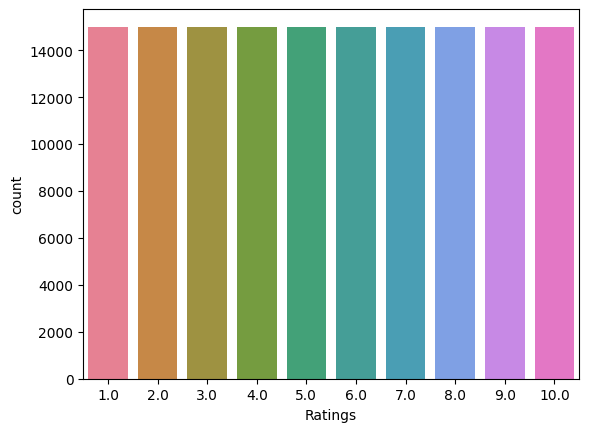

Ratings
1.0     15000
2.0     15000
4.0     15000
3.0     15000
5.0     15000
6.0     15000
8.0     15000
7.0     15000
10.0    15000
9.0     15000
Name: count, dtype: int64


In [ ]:
#Credit Madhav Mathur https://www.kaggle.com/code/madz2000/sentiment-analysis-cleaning-eda-bert-88-acc

#Checking for Class Imbalance
sns.countplot(x=data['Ratings'], palette='husl')  # You can use other palettes like 'viridis', 'coolwarm', 'Set1', etc.
plt.show()
print(data['Ratings'].value_counts())

CPU times: user 47.5 s, sys: 2.9 s, total: 50.4 s
Wall time: 50.7 s


(-0.5, 1499.5, 799.5, -0.5)

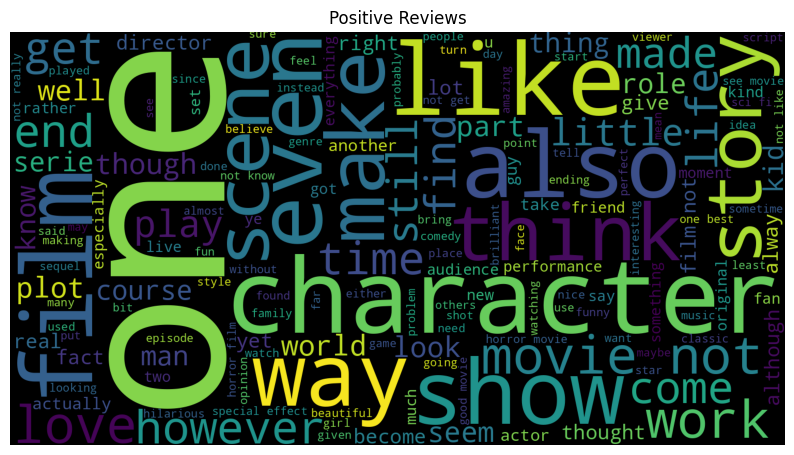

In [ ]:
%%time
'''----------------------------Visualization of Important Words from Positive Reviews--------------------'''
sentences=data['Reviews_clean']
pos=' '.join(map(str,sentences[data['Ratings']>=7]))
neg=' '.join(map(str,sentences[data['Ratings']<=4]))

pos_wordcloud = WordCloud(width = 1500, height = 800,
                background_color ='black',
                stopwords = stop_words,
                min_font_size = 15).generate(pos)

plt.figure(figsize=(10,10))
plt.imshow(pos_wordcloud)
plt.title('Positive Reviews')
plt.axis('off')

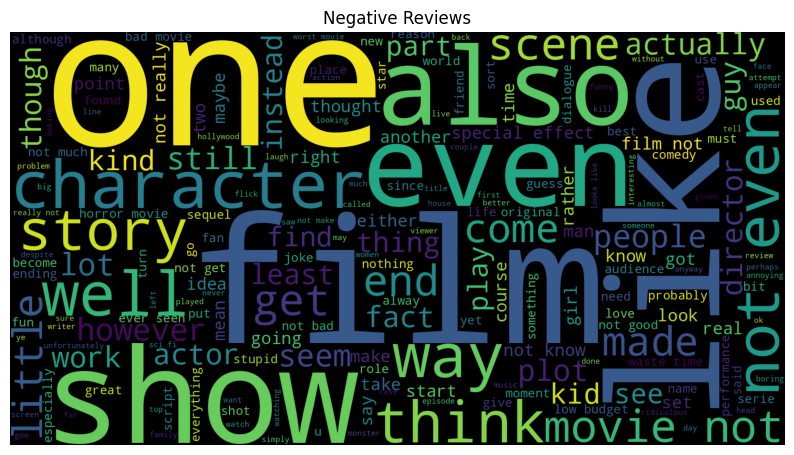

CPU times: user 44.5 s, sys: 2.07 s, total: 46.6 s
Wall time: 48.2 s


In [ ]:
%%time
'''----------------------------Visualization of Important Words from Negative Reviews--------------------'''

neg_wordcloud = WordCloud(width = 1500, height = 800,
                background_color ='black',
                stopwords = stop_words,
                min_font_size = 15).generate(neg)

plt.figure(figsize=(10,10))
plt.imshow(neg_wordcloud)
plt.title('Negative Reviews')
plt.axis('off')
plt.show()

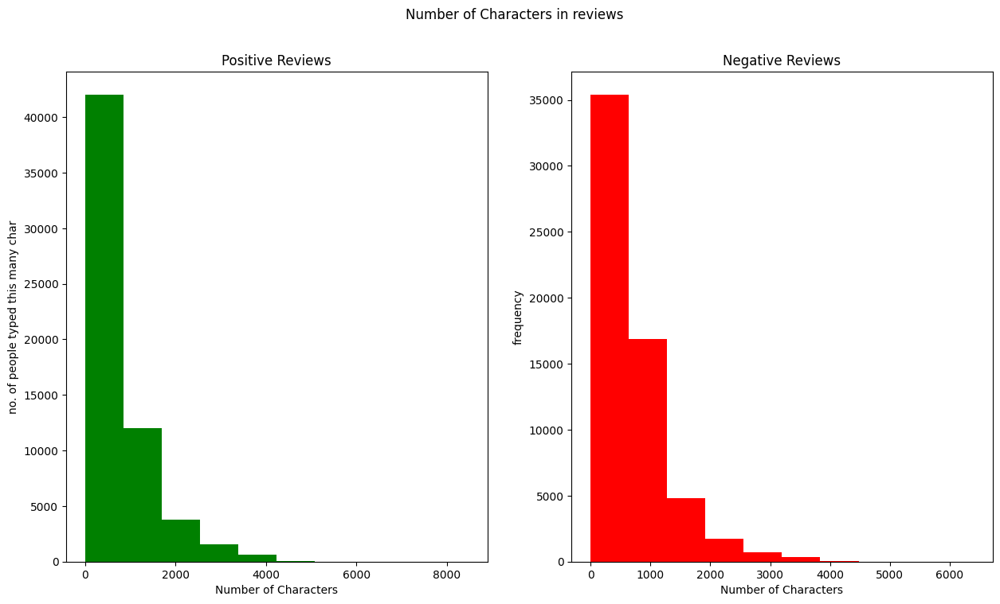

In [ ]:
#Visulaization of number of charactor in reviews
figure,(pos_ax,neg_ax)=plt.subplots(1,2,figsize=(15,8))

len_pos_review=data[data['Ratings']>=7]['Reviews_clean'].str.len()
pos_ax.hist(len_pos_review,color='green')
pos_ax.set_title('Positive Reviews')
pos_ax.set_xlabel('Number of Characters')
pos_ax.set_ylabel('no. of people typed this many char')

len_neg_review=data[data['Ratings']<=4]['Reviews_clean'].str.len()
neg_ax.hist(len_neg_review,color='red')
neg_ax.set_title('Negative Reviews')
figure.suptitle('Number of Characters in reviews')
neg_ax.set_xlabel('Number of Characters')
neg_ax.set_ylabel('frequency')

plt.show()

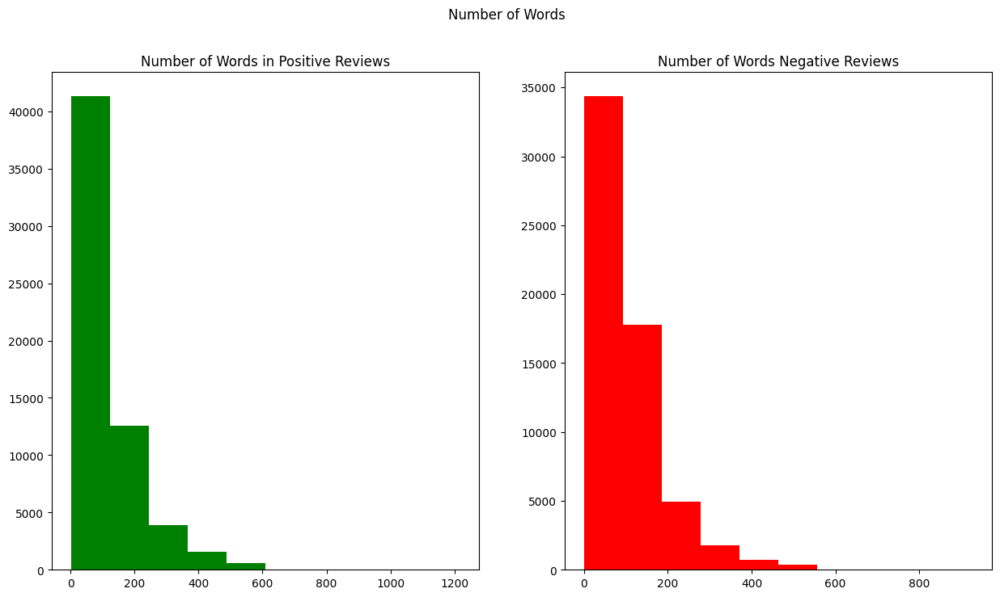

In [ ]:
#Visulaization of number of words in reviews
figure,(pos_ax,neg_ax)=plt.subplots(1,2,figsize=(15,8))
pos_word=data[data['Ratings']>=7]['Reviews_clean'].str.split().map(lambda review: len(review))
pos_ax.hist(pos_word,color='green')
pos_ax.set_title('Number of Words in Positive Reviews')
neg_word=data[data['Ratings']<=4]['Reviews_clean'].str.split().map(lambda review: len(review))
neg_ax.hist(neg_word,color='red')
neg_ax.set_title('Number of Words Negative Reviews')
figure.suptitle('Number of Words')
plt.show()

Text(0.5, 0.98, 'Average word length in Reviews')

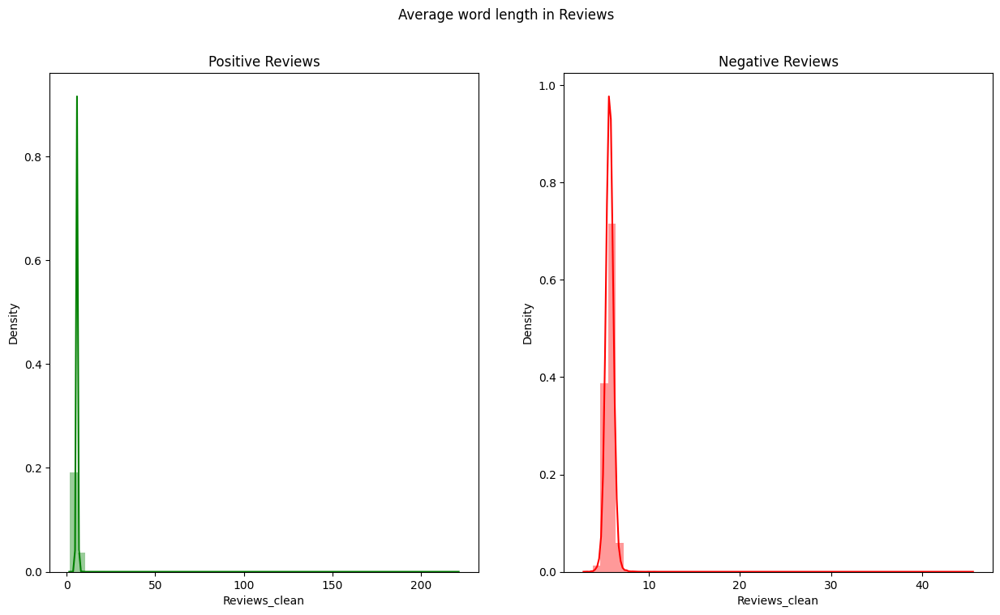

In [ ]:
#Visulaize average of words in reviews

figure,(pos_ax,neg_ax)=plt.subplots(1,2,figsize=(15,8))
pos_word=data[data['Ratings']>=7]['Reviews_clean'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(pos_word.map(lambda x: np.mean(x)),ax=pos_ax,color='green')
pos_ax.set_title('Positive Reviews')
neg_word=data[data['Ratings']<=4]['Reviews_clean'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(neg_word.map(lambda x: np.mean(x)),ax=neg_ax,color='red')
neg_ax.set_title('Negative Reviews')
figure.suptitle('Average word length in Reviews')

In [ ]:
#Get important feature by using Countvectorizer
def get_top_text_ngrams(corpus, n, g):                                          #n grams: occurence of multiple words together and we are checking frequency of n grams
    vec = CountVectorizer(ngram_range=(g, g)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [ ]:
most_common_uni = get_top_text_ngrams(data.Reviews_clean[data['Ratings']>=7],20,1) #we change 1 to 2 or 3 if we are interested in bigrams etc, 1 means unigram
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon Words in Positive Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

we need to fix not in positive reviews

In [ ]:
most_common_uni = get_top_text_ngrams(data.Reviews_clean[data['Ratings']>=7],20,2)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon bigram in Positive Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

here also fix the not related

In [ ]:

most_common_uni = get_top_text_ngrams(data.Reviews_clean[data['Ratings']>=7],20,3)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon trigram in Positive Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

In [ ]:
pd.options.display.max_colwidth = 1000
data[["Reviews","Ratings","Movies"]][(data['Ratings']>=7)&(data['Reviews'].str.contains("not like| not want| not big fan"))].head(30)

,Reviews,Ratings,Movies
90193,"Starring: Carmen Electra and Brooke Hogan.Scary fish story that really has a lot going for it – Scares,Girls in bikinis and a creature that is NEW ! So let's go out to sea and study,No not like ""The Suite Life On Deck"",But more like Fred Olen Ray 'Showtime' movies in the water.There are villains without fins and people with Brains & Boobs.The creature effects are really good looking as CGI and just fun when do in real time and on set with actors interacting with the teeth plus.This ATOLL set would make a great tourist attraction with a re-tooled 'BRUCE the shark' that was replaced at Universal Studios,Florida.",7.0,2-Headed Shark Attack
90198,"Some folks really downgraded this movie and the two main stars, Casper Van Dien and Elelnia Eliniak by stating their careers were over because of this movie. Come on folks these two are professional actors and know how to act. This movie was not as horrible as some would have us believe nor did their careers end. Just because one did not like the movie is no reason to slam dunk the actors. The movie was actually quite good because of the two main stars It's quite conceivable for a character named Van Helsing not to know at one time in earths ancient culture he had a relative who was a vampire killer. As far as the script it was okay, the cinematography was good as far as one can be from being inside a spacecraft. The vampires exhibited great strength and stealth. They were tall dark and handsome or beautiful and tempting. In the end all the vampires were slain at the expense of most of the crew. To see which vampire remains and which crew members remain and how the movie ends which...",7.0,Dracula 3000
90222,"Alone in the Dark 2 is a fun little Supernatural Thriller with a good little cast & i enjoyed it, it looks like a movie & was actually filmed on film which was very rare back then, & even more rare now it's almost extinct, it's all digital now only ""Tarantino"" still uses film that I've heard of!!!\nAlso the film looks very good with good use of colour & a very slick look with lots of blue & green, a very cool opening actually with a view of new york city & central park, then we go down to central park where we meet 3 witch hunters running from the old Hag, it's very cool.\nThe first film was just ok, not great but not as terrible as all those way over the top reviews destroying it was saying, as there's alot of much worse films out there!!!\nThe music is really good, it's eerie & full of suspense & this little B-movie actually has a strong creepy atmosphere & feels like one of those rare Horror gems you find on t.v in the middle of the night, good solid film.""Alone in the Dark 2"" r...",7.0,Alone in the Dark II
90251,"You have to understand with these kinds of movies (boa vs. python,frankenfish, sasquatch hunters, rottweiler, tower of blood), you are not going to like it. You are going to think it was soo bad it was hilarious. Most importantly you cannot take it seriously as a movie. You have to also watch it with friends so you can all yell and say how stupid something was, or call something that is about to happen. I have seen about 8 movies like this one and I did not like one, but I had an amusing time watching it. WARNING: If you are looking for a scary movie or an interesting suspenseful movie DO NOT WATCH THIS! If you are on the other hand seeing something with friends, and you cant find a good comedy watch one of these. If you pick this movie out because you thought it would be cool, you should have been eliminated from the gene pool years ago. My personal favorite out of these 5 is sasquatch hunters, it was beyond helpless.",7.0,Boa vs. Python
90287,"OK, let's look past the fact that the director, Christina Peters (aka Kat Slater), went on to direct a profusion of pulsating porn including, but not limited to, ""Young Sluts, Inc."" 1 thru 15 and ""Cum Swappers"" 1 thru 4.Let's look past the fact that basically every review is slamming this

but many times not is used to compare other movies etc or say this movie is better, so we gotta keep that in mind too

In [ ]:
#4 grams
most_common_uni = get_top_text_ngrams(data.Reviews_clean[data['Ratings']>=7],20,4)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon 4-gram in Positive Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

In [ ]:

most_common_uni = get_top_text_ngrams(data.Reviews_clean[data['Ratings']>=7],20,5)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon 5-gram in Positive Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

fix random words like lalala blah etc

In [ ]:
pd.options.display.max_colwidth = 1000
data[["Reviews","Ratings","Movies"]][(data['Ratings']>=9)&(data['Reviews'].str.contains("bad review"))].head(30)

,Reviews,Ratings,Movies
120211,"This movie was a blast for my little guys, they loved every minute of it, I have read all of the bad reviews, and could not disagree more. This movie, is pure and good. There is just enough action to keep the kids interested, and not so much that you leave the theater with them bouncing off the walls either. It is funny with jokes that everyone can appreciate. I think people have gotten used to so much violence and adult content in our kids movies that they are disappointed when it is missing, like the movie wasn't entertaining enough for the parents. Well, NEWS FLASH.....It's a kids movie, and a perfect one at that. Kids need these kinds of movies, not Spongebob and the like which are more to entertain the parents.",9.0,Doogal
120238,"I am a huge horror buff and prefer pieces that delve into the characters psychological issues. This film was awesome on so many levels, the acting and writing were fantastic and creepy and I was afraid or and empathetic with the murderer the whole time. What an interesting study on the line between sick and a danger to others, and the line between being a mean girl and being psychotic. Set in a great location, a house full of creepy art, in the winter in Conneticut and with amazing performances from many of my favorite actresses. It actually shocks me that others have given this such a bad review, I loved this movie, I guess it goes to show you everyone will have a different opinion but I say don't miss this film!",9.0,#Horror
120239,"No idea why there are so many bad reviews here? I loved it; I thought it was a very advanced thoughtful film. The graphic were #killer. The comparison of video game culture and young girl culture was spot on. This film makes connections that I've never seen on the big screen but, do see in every day life.The casting was spot on, Hello 12 year-old girls are supposed to be a little annoying. I do wish that more directors would take color into more consideration the way this film does. T The highly stylized sets make the murder scenes more believable because everything is so unbelievable. How can you live in 2016 and not ""get""a film about social media and accelerationism. #duh Someone explain this to me.",9.0,#Horror
120273,"What do you get when you cross Love Story with Star Wars with Blade Runner with Back to the Future with MTV? Love Story 2050, that's what. What a fun movie for the entire family. This fantasy of epic proportions is much, much better than AI, a similar sci-fi classic. The thrills are non-stop in this blockbuster, from its lead off car chase to bike racing stunts to the vantage point of a moving roller coaster to speeding hover-craft--you will be on the edge of your seat from beginning to end. The version I saw was only partially in English and I still was glued to the screen. I can't wait to see a version with subtitles. The mega budget special effects are out of this world and highly convincing. The future vision of XBox was hilarious. Those who are complaining about how long this movie is simply don't understand Bollywood. The three hours went by quickly; it seemed to be only an hour. There could have been a better twist with the Darth Vader character. For example, I suspected tha...",9.0,Love Story 2050
120334,"I don't understand the negative reviews for this movie.This deserve a 10 stars.Something is definitely wrong with people when they do not care for a positive message in a movie.This movie was beyond great,had a touch of everything.It shows what can happen when a person's influence can change lives.These young boys had no hope,they could not see a promising future.The streets are what they knew,and of course,some of you can't relate, but if you are a fair person,then you will try to understand it from that viewpoint.I was not raised in a bad neighborhood,nor the streets, and i still totally get this movie.Life is about sacrifices and there were many a lessons in this movie that are based on real life for s

In [ ]:
df = data.copy()

In [ ]:
most_common_uni = get_top_text_ngrams(df.Reviews_clean[df['Ratings']<=4],20,1)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon unigram in Negative Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

In [ ]:
most_common_uni = get_top_text_ngrams(df.Reviews_clean[df['Ratings']<=4],20,2)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon bigram in Negative Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

In [ ]:

most_common_uni = get_top_text_ngrams(df.Reviews_clean[df['Ratings']<=4],50,3)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon trigram in Negative Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

In [ ]:
most_common_uni = get_top_text_ngrams(df.Reviews_clean[df['Ratings']<=4],50,4)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon 4-gram in Negative Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

In [ ]:

most_common_uni = get_top_text_ngrams(df.Reviews_clean[df['Ratings']<=4],50,5)
most_common_uni = dict(most_common_uni)
temp = pd.DataFrame(columns = ["Common_words" , 'Count'])
temp["Common_words"] = list(most_common_uni.keys())
temp["Count"] = list(most_common_uni.values())
fig = px.bar(temp, x="Count", y="Common_words", title='Commmon 5-gram in Negative Reviews', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

In [ ]:
pd.options.display.max_colwidth = 1000
df[["Reviews","Ratings","Movies"]][(df['Ratings']<=4)&(df['Reviews_clean'].str.contains("good|great"))].head(100)

,Reviews,Ratings,Movies
3,"If you saw the other previous spoof movies by these two horrible gentlemen, then you should know that this already will be bad. I'll tell you the truth, if you want to watch it as a brainless person (ironically meant for the stereotypical teenagers, which I am not) then you will laugh at it a bit. But if you judge it, even a little, the movie automatically fails. Why? Never ask that when it comes to these two men.Remember the good old Hollywood days whenever making a movie was about showing people a type of art, and also a story that kept you on the edge of your seat? Well whenever word hit that making films earned you loads of cash, then all these greedy people came in the picture and its quite pathetic. These two are no exception. We still have movie artists (most notably the genius that is Christopher Nolan). But these two guys just...well I've been writing so big words, let me put it in simple terms for these guys...These guys suck, they are not artists, but instead money cravi...",1.0,Disaster Movie
6,"I was given a free ticket to this film; so I can't complain that I was ripped off (except in that some 90 minutes of my life were irretrievably stolen from me). These sort of movies (Date Movie, Epic Movie, Meet the Spartans) haven't been funny for some time now but ""Disaster Movie"" has reached a new low. There wasn't one real laugh anywhere in the film, and most of the alleged ""jokes"" were actually painful. (There was a considerable amount of childish, mean-spirited stuff in the form of racist, sexist, and especially homophobic, garbage present, along with ample helpings of juvenile gross-outs.) None of the actors were even bothering to put up any pretense of acting. There is nothing hip, clever, or even mildly intelligent going on here. The entire film is from beginning to end crass, vulgar, irrational, and utterly humorless in any human sense. I know that in the past these sort of trash has made enough money to keep Seltzer et al., grinding them out but ""Disaster Movie"" may just...",1.0,Disaster Movie
7,"OK, so ""Disastrous"" isn't an imaginative barb for this movie, but then there's not a shred of wit to the movie, so....I saw this movie for free. A friend who said he ""pissed his pants"" at the trailer had free passes. I think he's incontinent.A spoof of disaster movies might have been fun. This is not it. A couple disaster movies get referenced, not really spoofed. Instead, the ""spoofing"" is of recent movies of all genres, and of aspects of current pop-culture. Then again, how current is women's wrestling or the ""Head On"" commercials?If there's anything about it that's good, there's the 70 minute or so running time (where did they get 90 minutes?) and Nicole Parker seems like she might be good, if she had good material.",1.0,Disaster Movie
11,"I decided to go see this movie with some friends, just to have a laugh. We were hoping that it would be so bad that it would become funny. But it was just awful... I just cant take that kid seriously.Also, this movie just confirmed what we all knew, JB has an ego even bigger then Kayne West. The entire movie was like: ""Look at me, i'm a talented singer and a good person! There is simply nothing that i can't do!""What the movie forgot to mention is that its his mommies fat cigar smoking managers that made JB. he's a puppet. This movie could make him look better, but it just buried him deeper. I'm starting to think that this was done on purpose because the fat cats want to get rid of him.Would not recommend.",1.0,Justin Bieber: Never Say Never
12,"Right so everyone here on IMDb is pretty much committed to giving this ""movie""(if you can call it that) 1 out of 10 to get it to no.1 on the bottom 100 list. Trust me, they're right.I went to see it because I knew there was no way I could criticize this movie without seeing it.However, the film lacks any artistic merit whatsoever. It is full of the latest and greatest pop sensations of the Youtube 

fix the good/positive words in negative reviews whereever we can

In [ ]:
pd.options.display.max_colwidth = 1000
df[["Reviews","Ratings","Movies"]][(df['Ratings']<=4)&(df['Reviews_clean'].str.contains("saturday night friday"))].head(100)

,Reviews,Ratings,Movies
7055,"STAR RATING: ***** Saturday Night **** Friday Night *** Friday Morning ** Sunday Night * Monday Morning NO STARS End of Days A made for TV biopic of the pop icon Britney Spears (Natasha Bassett), from starting out with her breakthrough single Baby One More Time in 1999, where she was shoved into the limelight by her pushy mother Lynne (Nicole Oliver) and domineering manager Larry Rudolph (Peter Benson), who both naively thought she was old and mature enough to handle such massive media exposure and pushed her to lie about her virginity to keep up an illusion, through to the trials and turbulence of her relationships with Justin Timberlake (Nathan Keyes) and Kevin Federline (Clayton Chitty), before a revealing 2008 documentary aired.Sometimes, something can give you a really bad vibe, yet you still feel utterly compelled to see it. Your instinct can tell you it looks really bad, and you can see no end of bad reviews, and you can almost write a review before you've even seen it, but ...",1.0,Britney Ever After
17427,"STAR RATING: ***** Saturday Night **** Friday Night *** Friday Morning ** Sunday Night * Monday MorningWill (Joey Pollairi) is the new guy in high school, who stands out as a prime target for bullies. He soon makes friends with Jay (Zach Pearlman), Simon (Bubba Lewis) and Neil (Mark L. Young), three other social misfits who are not complete dorks but far from the coolest kids in school, either.It always spurs you on as a Brit when something home grown becomes a success, as I imagine it probably does for anyone from a small country that's not at the centre of the world (not anymore, anyway.) But it's a sad thing and a sign of the times when the only way to tell what a massive success it's been is when the Americans go and remake it. In fact, this is almost inevitable. And, inevitably, a whole lot worse.The best way I can describe The Inbetweeners USA is: imagine you've just read a really great Stephen King novel, and then see a film adaptation of it that is just like what you've rea...",2.0,The Inbetweeners
17818,"STAR RATING: ***** Saturday Night **** Friday Night *** Friday Morning ** Sunday Night * Monday Morning The premise behind this abysmal action thriller has a group of people going for a good old bit of paint ball, only to find themselves really fighting to stay alive as a barrage of real bullets are fired at them. But the characters are never developed or explored in any way, so it's impossible to care about any of them. Needless to say, there is no air of tension or suspense whatsoever, and the acting is so bad none of them have any life anyway, as though just running around shouting and screaming incoherently at each other gives them any life. Not that there was anything special to see there anyway, just the usual generic stereotypes typical for this genre. And here we have yet another film that hasn't learned the modern trend of shaking the camera around and darkening the lens is an off putting and annoying one rather than an endearing one. One to flee all round. *",2.0,Paintball
18138,"STAR RATING: ***** Saturday Night **** Friday Night *** Friday Morning ** Sunday Night * Monday Morning I could go to great pains to write a long, in depth review of The Last Seven, but it's hard to write much more about it other than my summary above. Right from the opening sequence, with one of the lead characters wondering around a deserted London shouting out for 'anybody!', just like in the aforementioned film, it just feels like such a pale imitation of it that it hurts. In fact, it's almost as if the director knew he was practically copying it scene for scene and just gave up bothering to tell any sort of decent story of his own. As such, it just goes through the motions of the post apocalyptic thriller genre, with the usual stereo-typical set up and characters, without firmly establishing the back story behind the majority of humanity being wiped out and making no sense. Most baffling

story related reviews^


#Data Cleaning and Preprocessing

Again copying the main dataframe and performing few steps

In [ ]:
df = data.copy()

In [ ]:
#Customize stopword as per data
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
new_stopwords = ["would","shall","could","might"]
stop_words.extend(new_stopwords)
stop_words.remove("not")
stop_words=set(stop_words)
print(stop_words)

{'they', 'me', 'does', 'should', 'wouldn', "wouldn't", 'from', "you've", 'what', 'until', 'won', 'in', 'other', 'didn', 'yours', 'below', "weren't", 'you', 'having', 'how', 'up', 'to', 'our', "you'd", 'she', 'that', "that'll", 'have', 'don', 'ma', 'will', 'yourselves', 'yourself', 'than', 'mustn', 'isn', 'am', 'too', 't', 'we', 'before', 'if', 'with', 'weren', 'few', 'my', "you're", 'these', 'no', 'more', "shouldn't", 'their', 'down', 'over', 'him', 'ourselves', "don't", 'again', 'needn', 'herself', 'll', 'shouldn', 'against', 'd', 'be', 'through', 'doing', "couldn't", 'once', 'when', 'while', "wasn't", 'some', 'those', 'as', 'during', 'any', 'ain', 'had', 'at', 'has', "you'll", 'your', "mightn't", 'm', 'haven', 'here', 'them', 'after', 'nor', 'wasn', 'shall', "it's", 'each', 've', "aren't", 'which', "hasn't", "haven't", 'why', 'into', 'both', 'out', "doesn't", 'o', 'off', "won't", 'myself', 'just', 'there', 'shan', 'i', 'who', 'now', 'might', "should've", 'same', 'couldn', 'where', 'o

In [ ]:
'''-----------------------------Data Cleaning and Preprocessing pipeline----------------------------------'''

#Removing special character
def remove_special_character(content):
    return re.sub('\W+',' ', content )#re.sub('\[[^&@#!]]*\]', '', content)

# Removing URL's
def remove_url(content):
    return re.sub(r'http\S+', '', content)

#Removing the stopwords from text
def remove_stopwords(content):
    clean_data = []
    for i in content.split():
        if i.strip().lower() not in stop_words and i.strip().lower().isalpha():
            clean_data.append(i.strip().lower())
    return " ".join(clean_data)

# Expansion of english contractions
def contraction_expansion(content):
    content = re.sub(r"won\'t", "would not", content)
    content = re.sub(r"can\'t", "can not", content)
    content = re.sub(r"don\'t", "do not", content)
    content = re.sub(r"shouldn\'t", "should not", content)
    content = re.sub(r"needn\'t", "need not", content)
    content = re.sub(r"hasn\'t", "has not", content)
    content = re.sub(r"haven\'t", "have not", content)
    content = re.sub(r"weren\'t", "were not", content)
    content = re.sub(r"mightn\'t", "might not", content)
    content = re.sub(r"didn\'t", "did not", content)
    content = re.sub(r"n\'t", " not", content)
    '''content = re.sub(r"\'re", " are", content)
    content = re.sub(r"\'s", " is", content)
    content = re.sub(r"\'d", " would", content)
    content = re.sub(r"\'ll", " will", content)
    content = re.sub(r"\'t", " not", content)
    content = re.sub(r"\'ve", " have", content)
    content = re.sub(r"\'m", " am", content)'''
    return content

#Data preprocessing
def data_cleaning(content):
    content = contraction_expansion(content)
    content = remove_special_character(content)
    content = remove_url(content)

    content = remove_stopwords(content)
    return content

In [ ]:
%%time
pd.options.display.max_colwidth = 1000
#Data cleaning
df['Reviews_clean']=df['Reviews'].apply(data_cleaning)
df.head(5)

CPU times: user 22.9 s, sys: 116 ms, total: 23 s
Wall time: 23.2 s


,Ratings,Reviews,Movies,Resenhas,Reviews_clean
0,1.0,"*Disclaimer: I only watched this movie as a conditional agreement. And I see films for free. I wouldn't be caught dead giving my hard earned money to these idiots.Well, to explain the depth of this 'film', I could write my shortest review, ever. Don't see this movie. It is by far the stupidest, lamest, most lazy, and unbelievably UNFUNNY movie I have ever seen. It is a total disaster. But since my hatred for this movie, and the others like it, extends far beyond one viewing, I think I'll go on for a bit.I don't know any of the people in the movie besides Carmen Electra, Vanessa Minnillo, and Kim Kardashian, but it doesn't matter. They're all horrible, though I think that was the point. The editing is flat out horrible, and possibly blatant continuity errors make this crapfast even crappier than I thought it would be. Now I know that these films are not supposed to be serious at all, but come on, it's film-making 101 that if someone gets a minor facial cut, it should be there in the...",Disaster Movie,"* Isenção de responsabilidade: eu só assisti esse filme como um acordo condicional. E eu vejo filmes de graça. Eu não seria pego morto dando meu dinheiro suado a esses idiotas. Bem, para explicar a profundidade desse 'filme', eu poderia escrever minha crítica mais curta de todos os tempos. Não vê este filme. É de longe o filme mais estúpido, lamenta, preguiçoso e inacreditavelmente UNFUNNY que eu já vi. É um desastre total. Mas como o meu ódio por este filme e por outros, se estende muito além de uma exibição, acho que vou continuar um pouco. Não conheço nenhuma das pessoas do filme além de Carmen Electra, Vanessa Minnillo, e Kim Kardashian, mas isso não importa. Eles são todos horríveis, embora eu ache que esse seja o ponto. A edição é horrível e, possivelmente, erros de continuidade flagrantes tornam essa porcaria ainda mais horrível do que eu pensava. Agora eu sei que esses filmes não devem ser sérios, mas vamos lá, é o cinema 101 que se alguém fizer um pequeno corte facial, ele...",disclaimer watched movie conditional agreement see films free not caught dead giving hard earned money idiots well explain depth film write shortest review ever not see movie far stupidest lamest lazy unbelievably unfunny movie ever seen total disaster since hatred movie others like extends far beyond one viewing think go bit not know people movie besides carmen electra vanessa minnillo kim kardashian not matter horrible though think point editing flat horrible possibly blatant continuity errors make crapfast even crappier thought know films not supposed serious come film making someone gets minor facial cut next shot someone gets cut sword blood least cut though since narnia films get away give disaster movie pass jokes thoughtless mindless physical gags obviously take popular movies last year late well including best picture nominees know saddest thing stupid movies not care much money make many cameos sorry ass excuses films taking away jobs actors writers directors truly deserv...
1,1.0,"I am writing this in hopes that this gets put over the previous review of this ""film"". How anyone can find this slop entertaining is completely beyond me. First of all a spoof film entitled ""Disaster Movie"", should indeed be a spoof on disaster films. Now I have seen 1 (yes count them, 1) disaster film being spoofed, that being ""Twister"". How does Juno, Iron Man, Batman, The Hulk, Alvin and the Chipmunks, Amy Winehouse, or Hancock register as Disaster films? Selzterwater and Failburg once again have shown that they lack any sort of writing skill and humor. Having unfortunately been tortured with Date Movie and Epic Movie I know exactly what to expect from these two...no plot, no jokes just bad references and cheaply remade scenes from other films. Someone should have informed them that satire is more than just copy and paste from one film to another, though I shouldn't say that because some of these ac

#FEATURE ENGINEERING

In [ ]:
#Mapping rating data to Binary label 1 (+ve) if rating >=7 and 0 (-ve) if rating <=4 and 2 (neutral) if rating = 5 or 6
df['Label'] = df['Ratings'].apply(lambda x: '1' if x >= 7 else ('0' if x<=4 else '2'))

#Removing neutral class cuz we want only positive or negative
df=df[df.Label<'2']
data=df[['Reviews_clean','Label']]
print(data['Label'].value_counts())

Label
0    60000
1    60000
Name: count, dtype: int64


In [ ]:
!pip install prettytable # Install the missing package 'prettytable' using pip.


In [ ]:
#Importing dependencies for feature engineering
import sys
import os
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
from prettytable import PrettyTable
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('punkt_tab')
nltk.download('wordnet')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

#Lemmatization

In [ ]:
# lemmatization of word
class LemmaTokenizer(object):
    def __init__(self):
        self.wordnetlemma = WordNetLemmatizer()
    def __call__(self, reviews):
        return [self.wordnetlemma.lemmatize(word) for word in word_tokenize(reviews)]

maybe use functions instead of writing everytime?

In [ ]:
def count_tdidf(data, n):
  train,test=train_test_split(data,test_size=.3,random_state=42, shuffle=True)
  countvect = CountVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(n,n), min_df=10,max_features=500)
  tfidfvect = TfidfVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(n,n),min_df=10,max_features=500)
  x_train_count = countvect.fit_transform(train['Reviews_clean']).toarray()
  x_test_count = countvect.transform(test['Reviews_clean']).toarray()
  x_train_tfidf = tfidfvect.fit_transform(train['Reviews_clean']).toarray()
  x_test_tfidf = tfidfvect.transform(test['Reviews_clean']).toarray()
  y_train = train['Label']
  y_test = test['Label']
  return x_train_count,x_test_count,x_train_tfidf,x_test_tfidf,y_train,y_test

def lrc(x_test_count, x_train_count, y_train, y_test):
  lgr = LogisticRegression()
  lgr.fit(x_train_count,y_train)
  lgr.score(x_test_count,y_test)
  lgr.coef_[0]
  i=0
  importantfeature = PrettyTable(["Feature", "Score"])
  for feature, importance in zip(countvect.get_feature_names(), lgr.coef_[0]):
      if i<=200:
          importantfeature.add_row([feature, importance])
          i=i+1
  print(importantfeature)

def lrtdidf(x_test_tfidf,y_test, x_train_tfidf,y_train):
  lgr = LogisticRegression()
  lgr.fit(x_train_tfidf,y_train)
  lgr.score(x_test_tfidf,y_test)
  lgr.coef_[0]
  i=0
  importantfeature = PrettyTable(["Feature", "Score"])
  for feature, importance in zip(tfidfvect.get_feature_names(), lgr.coef_[0]):
      if i<=100:
          importantfeature.add_row([feature, importance])
          i=i+1
  print(importantfeature)


#Vectoization with Count Vectorizer and TDIDF Vectorizer with Unigram

In [ ]:
train,test=train_test_split(data,test_size=.3,random_state=42, shuffle=True)
countvect = CountVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(1,1), min_df=10,max_features=500)
tfidfvect = TfidfVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(1,1),min_df=10,max_features=500)
x_train_count = countvect.fit_transform(train['Reviews_clean']).toarray()
x_test_count = countvect.transform(test['Reviews_clean']).toarray()
x_train_tfidf = tfidfvect.fit_transform(train['Reviews_clean']).toarray()
x_test_tfidf = tfidfvect.transform(test['Reviews_clean']).toarray()
y_train = train['Label']
y_test = test['Label']

##Feature Importance with Logistic Regression and Count Vectorizer with unigram

In [ ]:
lgr = LogisticRegression()
lgr.fit(x_train_count,y_train)
lgr.score(x_test_count,y_test)
lgr.coef_[0]
i=0
importantfeature = PrettyTable(["Feature", "Score"])
for feature, importance in zip(countvect.get_feature_names_out(), lgr.coef_[0]):
    if i<=200:
        importantfeature.add_row([feature, importance])
        i=i+1
print(importantfeature)

+----------------+------------------------+
|    Feature     |         Score          |
+----------------+------------------------+
|      able      |  0.10525769670061859   |
|   absolutely   |  0.05657355841025669   |
|      act       |  -0.15615897497890496  |
|     acting     |  -0.1690702138832183   |
|     action     |  0.26497423276954424   |
|     actor      |  -0.12911177745017707  |
|    actress     |  -0.14275981750972278  |
|    actually    |   -0.052749878853211   |
|      add       |  0.027075916628216717  |
|     adult      |  0.05682674585290614   |
|      age       |  0.09980361363980476   |
|     alien      |  -0.07086333049061318  |
|     almost     | -0.015407230794611718  |
|     along      |  0.12106302372189015   |
|    already     |  -0.20704293130399287  |
|      also      |   0.0981582766561121   |
|    although    |   0.195939755564778    |
|     always     |   0.1989447984114396   |
|    amazing     |   0.8392415074264262   |
|    american    |  0.0495120851

##Feature Importance with TFIDF vectorizer and Logistic Regression with Unigram

In [ ]:
lgr = LogisticRegression()
lgr.fit(x_train_tfidf,y_train)
lgr.score(x_test_tfidf,y_test)
lgr.coef_[0]
i=0
importantfeature = PrettyTable(["Feature", "Score"])
for feature, importance in zip(tfidfvect.get_feature_names_out(), lgr.coef_[0]):
    if i<=100:
        importantfeature.add_row([feature, importance])
        i=i+1
print(importantfeature)

+----------------+------------------------+
|    Feature     |         Score          |
+----------------+------------------------+
|      able      |   0.3984134768687318   |
|   absolutely   |   0.5096517038629418   |
|      act       |   -1.053492238649382   |
|     acting     |  -1.6446853500091672   |
|     action     |   2.6458293854655537   |
|     actor      |  -1.3386359906726208   |
|    actress     |  -0.9970937455439989   |
|    actually    |  -0.48421298729562795  |
|      add       |  0.14285020160084805   |
|     adult      |   0.716935952037384    |
|      age       |   0.7660918281981023   |
|     alien      |  -0.3251561404044222   |
|     almost     |  -0.31101212915778453  |
|     along      |   0.7520482832737798   |
|    already     |  -1.1736836188041855   |
|      also      |   1.2210994141609022   |
|    although    |   1.2277991759729112   |
|     always     |   1.7018882306790108   |
|    amazing     |   4.823718025743338    |
|    american    |  0.4200082190

##Vectorization with Count Vectorizer and TDIDF Vectorizer with Bigram

In [ ]:
train,test=train_test_split(data,test_size=.3,random_state=42, shuffle=True)
countvect = CountVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(2,2), min_df=10,max_features=500)
tfidfvect = TfidfVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(2,2),min_df=10,max_features=500)
x_train_count = countvect.fit_transform(train['Reviews_clean']).toarray()
x_test_count = countvect.transform(test['Reviews_clean']).toarray()
x_train_tfidf = tfidfvect.fit_transform(train['Reviews_clean']).toarray()
x_test_tfidf = tfidfvect.transform(test['Reviews_clean']).toarray()
y_train = train['Label']
y_test = test['Label']

##Feature Importance with Logistic Regression and Count Vectorizer with Bigram

In [ ]:
lgr = LogisticRegression()
lgr.fit(x_train_count,y_train)
lgr.score(x_test_count,y_test)
lgr.coef_[0]
i=0
importantfeature = PrettyTable(["Feature", "Score"])
for feature, importance in zip(countvect.get_feature_names_out(), lgr.coef_[0]):
    if i<=200:
        importantfeature.add_row([feature, importance])
        i=i+1
print(importantfeature)

+-----------------------+-----------------------+
|        Feature        |         Score         |
+-----------------------+-----------------------+
|       acting bad      |  -1.3473272003728562  |
|      acting good      |   0.6521061122131749  |
|       acting not      |  -0.4590463815884328  |
|      action film      |  0.37121398155793434  |
|      action movie     |  0.28740343816808284  |
|     action packed     |   1.341808372650422   |
|      action scene     |  0.17103817837950863  |
|    action sequence    |  0.09735709627408495  |
|     actor actress     |   -0.128690733779353  |
|       actor not       |  -0.3845148255790777  |
|      almost every     |  -0.13565911104162817 |
|       along way       |   0.4901105064356643  |
|        also not       |  -0.1371122184594034  |
|      although not     |   0.5009343660143875  |
|     anything else     |  -0.3160028430569908  |
|        b movie        |  -0.09112964092161474 |
|       bad acting      |  -1.0494892794966242  |


##Feature Importance with Logistic Regression and TFIDF Vectorizer with Bigram

In [ ]:
lgr.fit(x_train_tfidf,y_train)
lgr.score(x_test_tfidf,y_test)
lgr.coef_[0]
i=0
importantfeature = PrettyTable(["Feature", "Score"])
for feature, importance in zip(tfidfvect.get_feature_names_out(), lgr.coef_[0]):
    if i<=50:
        importantfeature.add_row([feature, importance])
        i=i+1
print(importantfeature)

+-----------------------+----------------------+
|        Feature        |        Score         |
+-----------------------+----------------------+
|       acting bad      | -2.9393799327174364  |
|      acting good      |  1.4548566681171957  |
|       acting not      |  -1.273820185097583  |
|      action film      |  1.2197327242145297  |
|      action movie     |  0.8613829055692434  |
|     action packed     |  2.947838155321147   |
|      action scene     | 0.47358357937200146  |
|    action sequence    |  0.2927391289679885  |
|     actor actress     | -0.26249084238989945 |
|       actor not       |  -0.934582963284988  |
|      almost every     | -0.3017139465150734  |
|       along way       |  1.100297756482277   |
|        also not       | -0.2979065031498134  |
|      although not     |  1.1223886237405394  |
|     anything else     | -0.8002272369716119  |
|        b movie        | -0.4302489923282411  |
|       bad acting      | -2.7783360455825354  |
|        bad bad    

##Vectorization with Count Vectorizer and TFIDF Vectorizer with Trigram

In [ ]:
train,test=train_test_split(data,test_size=.3,random_state=42, shuffle=True)
countvect = CountVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(3,3), min_df=10,max_features=500)
tfidfvect = TfidfVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(3,3),min_df=10,max_features=500)
x_train_count = countvect.fit_transform(train['Reviews_clean']).toarray()
x_test_count = countvect.transform(test['Reviews_clean']).toarray()
x_train_tfidf = tfidfvect.fit_transform(train['Reviews_clean']).toarray()
x_test_tfidf = tfidfvect.transform(test['Reviews_clean']).toarray()
y_train = train['Label']
y_test = test['Label']

##Feature Importance with Logistic Regression and Count Vectorizer with Trigram

In [ ]:
lgr = LogisticRegression()
lgr.fit(x_train_count,y_train)
lgr.score(x_test_count,y_test)
lgr.coef_[0]
i=0
importantfeature = PrettyTable(["Feature", "Score"])
for feature, importance in zip(countvect.get_feature_names_out(), lgr.coef_[0]):
    if i<=200:
        importantfeature.add_row([feature, importance])
        i=i+1
print(importantfeature)

+---------------------------+------------------------+
|          Feature          |         Score          |
+---------------------------+------------------------+
|       acting not bad      |  -0.40935653589491733  |
|      acting not good      |  -1.0947661699605593   |
|      acting not great     |  -0.48963402867532513  |
|     acting pretty good    |   0.994073759105964    |
|      acting top notch     |   1.8141437167524659   |
|      action movie not     |   1.081658125913207    |
|      action set piece     |   1.248177259319287    |
|     action take place     |  0.03729759325904384   |
|       actor good job      |   0.6164565865776819   |
|    actually pretty good   |  0.30748392905350086   |
|    actually quite good    |  -0.15925005476423532  |
|     almost every scene    |  -0.32515565603782676  |
|        b movie not        |  -0.04559712132034218  |
|       bad acting bad      |  -2.3524388933030425   |
|        bad bad bad        |  -1.8018648374449135   |
|        b

##Feature Importance with Logistic Regression and TFIDF Vectorizer with Trigram

In [ ]:
lgr = LogisticRegression()
lgr.fit(x_train_tfidf,y_train)
lgr.score(x_test_tfidf,y_test)
lgr.coef_[0]
i=0
importantfeature = PrettyTable(["Feature", "Score"])
for feature, importance in zip(countvect.get_feature_names_out(), lgr.coef_[0]):
    if i<=200:
        importantfeature.add_row([feature, importance])
        i=i+1
print(importantfeature)

+---------------------------+------------------------+
|          Feature          |         Score          |
+---------------------------+------------------------+
|       acting not bad      |  -0.5644536233074314   |
|      acting not good      |   -1.362221189172436   |
|      acting not great     |  -0.6796635736797176   |
|     acting pretty good    |   1.1318093710649193   |
|      acting top notch     |   2.059339507897055    |
|      action movie not     |   1.2774252850759622   |
|      action set piece     |   1.2631913554023448   |
|     action take place     |  0.08811694277626027   |
|       actor good job      |   0.6919829791057158   |
|    actually pretty good   |   0.3414700366790136   |
|    actually quite good    |  -0.13838040873958993  |
|     almost every scene    |  -0.3842023058946787   |
|        b movie not        |  -0.0967957262984477   |
|       bad acting bad      |  -2.9343334396578804   |
|        bad bad bad        |  -2.4784010586366354   |
|        b

##Vectorization with Count Vectorizer and TDIDF Vectorizer with 4-gram

In [ ]:
train,test=train_test_split(data,test_size=.3,random_state=42, shuffle=True)
countvect = CountVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(4,4), min_df=10,max_features=500)
tfidfvect = TfidfVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(4,4),min_df=10,max_features=500)
x_train_count = countvect.fit_transform(train['Reviews_clean']).toarray()
x_test_count = countvect.transform(test['Reviews_clean']).toarray()
x_train_tfidf = tfidfvect.fit_transform(train['Reviews_clean']).toarray()
x_test_tfidf = tfidfvect.transform(test['Reviews_clean']).toarray()
y_train = train['Label']
y_test = test['Label']

##Feature Importance with Logistic Regression and Count Vectorizer with 4-gram

In [ ]:
lgr = LogisticRegression()
lgr.fit(x_train_count,y_train)
lgr.score(x_test_count,y_test)
lgr.coef_[0]
i=0
importantfeature = PrettyTable(["Feature", "Score"])
for feature, importance in zip(countvect.get_feature_names_out(), lgr.coef_[0]):
    if i<=200:
        importantfeature.add_row([feature, importance])
        i=i+1
print(importantfeature)

+------------------------------------------------+----------------------+
|                    Feature                     |        Score         |
+------------------------------------------------+----------------------+
|         according dvd sleeve synopsis          |  -2.11783301364517   |
|           acting also great special            |  0.4887200233688551  |
|             acting bad script bad              | -1.0247994816649975  |
|     addictive consistently compelling show     | 0.26196094267381625  |
|                 ai not gon na                  | -0.5062681052072497  |
|             also great acting also             |  0.3962110289902121  |
|           also great special effect            |  0.8424291299124014  |
|       annoying illogical decision making       |  -0.275749803099059  |
|           another film seen recently           | -0.30208375767897394 |
|         appreciation horror low budget         | -0.26588845591357324 |
|        atmosphere dreary due excessi

##Feature Importance with Logistic Regression and TDIDF Vectorizer with 4-gram

In [ ]:
lgr = LogisticRegression()
lgr.fit(x_train_tfidf,y_train)
lgr.score(x_test_tfidf,y_test)
lgr.coef_[0]
i=0
importantfeature = PrettyTable(["Feature", "Score"])
for feature, importance in zip(tfidfvect.get_feature_names_out(), lgr.coef_[0]):
    if i<=200:
        importantfeature.add_row([feature, importance])
        i=i+1
print(importantfeature)

+------------------------------------------------+-----------------------+
|                    Feature                     |         Score         |
+------------------------------------------------+-----------------------+
|         according dvd sleeve synopsis          |  -2.1812052503078676  |
|           acting also great special            |   0.6325302242880013  |
|             acting bad script bad              |  -1.2334985648057568  |
|     addictive consistently compelling show     |  0.23605590287029102  |
|                 ai not gon na                  |  -0.4777847405859777  |
|             also great acting also             |   0.5357355794797841  |
|           also great special effect            |   0.9166252915331116  |
|       annoying illogical decision making       |  -0.22348574013369255 |
|           another film seen recently           |  -0.2431503541720195  |
|         appreciation horror low budget         |  -0.2602428187358617  |
|        atmosphere drear

#Vectorization with Count Vectorizer and TDIDF Vectorizer with unigram, bigram and trigram

In [ ]:
train,test=train_test_split(data,test_size=.3,random_state=42, shuffle=True)
countvect = CountVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(1,3), min_df=10,max_features=5000)
tfidfvect = TfidfVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(1,3),min_df=10,max_features=5000)
x_train_count = countvect.fit_transform(train['Reviews_clean']).toarray()
x_test_count = countvect.transform(test['Reviews_clean']).toarray()
x_train_tfidf = tfidfvect.fit_transform(train['Reviews_clean']).toarray()
x_test_tfidf = tfidfvect.transform(test['Reviews_clean']).toarray()
y_train = train['Label']
y_test = test['Label']

##Feature Selection with Chi squared

In [ ]:
from sklearn.feature_selection import chi2
import numpy as np
N = 5000
Number = 1
featureselection = PrettyTable(["Unigram", "Bigram","Trigram"])
for category in train['Label'].unique():
    features_chi2 = chi2(x_train_tfidf, train['Label'] == category)
    indices = np.argsort(features_chi2[0])
    feature_names = np.array(tfidfvect.get_feature_names_out())[indices]
    unigrams = [x for x in feature_names if len(x.split(' ')) == 1]
    bigrams = [x for x in feature_names if len(x.split(' ')) == 2]
    trigrams = [x for x in feature_names if len(x.split(' ')) == 3]
    print("%s. %s :" % (Number,category))
    print("\t# Unigrams :\n\t. %s" %('\n\t. '.join(unigrams[-N:])))
    print("\t# Bigrams :\n\t. %s" %('\n\t. '.join(bigrams[-N:])))
    print("\t# Trigrams :\n\t. %s" %('\n\t. '.join(trigrams[-N:])))
    Number += 1

Streaming output truncated to the last 5000 lines.
	. returning
	. land
	. strike
	. nicole
	. spirited
	. oil
	. claude
	. deliberately
	. exorcism
	. pre
	. ashley
	. finding
	. huge
	. characterization
	. forth
	. join
	. appearance
	. survivor
	. speaks
	. spite
	. item
	. flying
	. steven
	. tie
	. sea
	. fairly
	. hook
	. chief
	. twin
	. religious
	. freak
	. believed
	. jay
	. football
	. halloween
	. reporter
	. energy
	. judging
	. vacation
	. starring
	. comparison
	. rank
	. remaining
	. fare
	. grey
	. broken
	. colour
	. inspiration
	. chasing
	. journalist
	. meaningful
	. club
	. saturday
	. heavy
	. air
	. confusion
	. usa
	. african
	. professional
	. argue
	. needed
	. exchange
	. shadow
	. wow
	. starting
	. birthday
	. second
	. road
	. person
	. numerous
	. river
	. rap
	. decides
	. virus
	. traveling
	. quick
	. ant
	. develop
	. butt
	. laura
	. exaggerated
	. cousin
	. training
	. officer
	. pregnant
	. accident
	. arrive
	. occur
	. frequently
	. mexican
	. w

#MODEL SELECTION

In [ ]:
# Import prerequisite libraries
import sys
import numpy as np
import scipy as sp
import sklearn as sk
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, roc_auc_score, precision_score, recall_score
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline

##logistic regression model

In [ ]:
model_1=LogisticRegression()

In [ ]:
%%time
model_1.fit(x_train_tfidf,y_train)

In [ ]:
%%time
print("Precision Score on training dateset for Logistic Regression: %s" % precision_score(y_train,model_1.predict(x_train_tfidf),average='micro'))
print("AUC Score on training dateset for Logistic Regression: %s" % roc_auc_score(y_train,model_1.predict_proba(x_train_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_train_1 =f1_score(y_train,model_1.predict(x_train_tfidf),average="weighted")
print("F1 Score ftraining dateset for Logistic Regression: %s" % f1_score_train_1)
print("Precision Score on test for Logistic Regression: %s" % precision_score(y_test,model_1.predict(x_test_tfidf),average='micro'))
print("AUC Score on test for Logistic Regression: %s" % roc_auc_score(y_test,model_1.predict_proba(x_test_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_1 =f1_score(y_test,model_1.predict(x_test_tfidf),average="weighted")
print("F1 Score for Logistic Regression: %s" % f1_score_1)

##decision tree classifier

In [ ]:
model_2 = Pipeline(
    steps=[
        #("classifier", DecisionTreeClassifier(criterion='gini', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, class_weight=None, ccp_alpha=0.0)),
    ("classifier", DecisionTreeClassifier())
    ]
)

In [ ]:
%%time
model_2.fit(x_train_tfidf,y_train)

In [ ]:
%%time
print("Precision Score on training dateset for Decision Tree Classifier: %s" % precision_score(y_train,model_2.predict(x_train_tfidf),average='micro'))
print("AUC Score on training dateset for Decision Tree Classifier: %s" % roc_auc_score(y_train,model_2.predict_proba(x_train_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_train_2 =f1_score(y_train,model_2.predict(x_train_tfidf),average="weighted")
print("F1 Score training dateset for Decision Tree Classifier: %s" % f1_score_train_2)
print("Precision Score on test for Decision Tree Classifier: %s" % precision_score(y_test,model_2.predict(x_test_tfidf),average='micro'))
print("AUC Score on test for Decision Tree Classifier: %s" % roc_auc_score(y_test,model_2.predict_proba(x_test_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_2 =f1_score(y_test,model_2.predict(x_test_tfidf),average="weighted")
print("F1 Score for Decision Tree Classifier: %s" % f1_score_2)

we can see precision, auc and f1 score decreased for test data, thus this means overfitting problems

##Decision Tree Classifier with max depth 11 to fix overfit

In [ ]:
model_3 = Pipeline(
    steps=[
        ("classifier", DecisionTreeClassifier( criterion='gini', max_depth=11, min_samples_split=2, min_samples_leaf=1)),
    ]
)

In [ ]:
%%time
model_3.fit(x_train_tfidf,y_train)

In [ ]:
%%time
print("Precision Score on training dateset for Decision Tree Classifier: %s" % precision_score(y_train,model_3.predict(x_train_tfidf),average='micro'))
print("AUC Score on training dateset for Decision Tree Classifier: %s" % roc_auc_score(y_train,model_3.predict_proba(x_train_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_train_3 =f1_score(y_train,model_3.predict(x_train_tfidf),average="weighted")
print("F1 Score training dateset for Decision Tree Classifier: %s" % f1_score_train_3)
print("Precision Score on test for Decision Tree Classifier: %s" % precision_score(y_test,model_3.predict(x_test_tfidf),average='micro'))
print("AUC Score on test for Decision Tree Classifier: %s" % roc_auc_score(y_test,model_3.predict_proba(x_test_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_3 =f1_score(y_test,model_3.predict(x_test_tfidf),average="weighted")
print("F1 Score for Decision Tree Classifier: %s" % f1_score_3)

##random forest classifier


In [ ]:
model_4 = Pipeline(
    steps=[
        #("classifier", RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=15, min_samples_split=3, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='sqrt', max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None))
    ("classifier", RandomForestClassifier())]
)

In [ ]:
%%time
model_4.fit(x_train_tfidf,y_train)

In [ ]:
%%time
print("Precision Score on training dateset for Random Forest Classifier: %s" % precision_score(y_train,model_4.predict(x_train_tfidf),average='micro'))
print("AUC Score on training dateset for Random Forest Classifier: %s" % roc_auc_score(y_train,model_4.predict_proba(x_train_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_train_4 =f1_score(y_train,model_4.predict(x_train_tfidf),average="weighted")
print("F1 Score training dateset for Random Forest Classifier: %s" % f1_score_train_4)
print("Precision Score on test for Random Forest Classifier: %s" % precision_score(y_test,model_4.predict(x_test_tfidf),average='micro'))
print("AUC Score on test for Random Forest Classifier: %s" % roc_auc_score(y_test,model_4.predict_proba(x_test_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_4 =f1_score(y_test,model_4.predict(x_test_tfidf),average="weighted")
print("F1 Score for Random Forest Classifier: %s" % f1_score_4)

##ada boost classifier

In [ ]:
'''model_5 = Pipeline(
    steps=[
        ("classifier", AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=4),
    n_estimators=100,
    learning_rate=.8)),
    ]
)'''


'''model_5 = Pipeline(
    steps=[
        ("classifier", AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=4),
                                          n_estimators=100,
                                          learning_rate=.8)),
    ]
)'''

In [ ]:
'''%%time
model_5.fit(x_train_tfidf,y_train)'''

took 45mins

In [ ]:
'''%%time
print("Precision Score on training dateset for Ada Boost Classifier: %s" % precision_score(y_train,model_5.predict(x_train_tfidf),average='micro'))
print("AUC Score on training dateset for Ada Boost Classifier: %s" % roc_auc_score(y_train,model_5.predict_proba(x_train_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_train_5 =f1_score(y_train,model_5.predict(x_train_tfidf),average="weighted")
print("F1 Score training dateset for Ada Boost Classifier: %s" % f1_score_train_5)
print("Precision Score on test for Ada Boost Classifier: %s" % precision_score(y_test,model_5.predict(x_test_tfidf),average='micro'))
print("AUC Score on test for Ada Boost Classifier: %s" % roc_auc_score(y_test,model_5.predict_proba(x_test_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_5 =f1_score(y_test,model_5.predict(x_test_tfidf),average="weighted")
print("F1 Score for Random Forest Classifier: %s" % f1_score_5)'''

#Hyperparameter Tunning with Grid Search

In [ ]:
import numpy as np
import pandas as pd
from sklearn import ensemble
from sklearn import metrics
from sklearn import model_selection

def hyperparamtune(classifier, param_grid,metric,verbose_value,cv):
    model=model_selection.GridSearchCV(
            estimator=classifier,
            param_grid=param_grid,
            scoring=metric,
            verbose=verbose_value,
            cv=cv)

    model.fit(x_train_tfidf,y_train)
    print("Best Score %s" % {model.best_score_})
    print("Best hyperparameter set:")
    best_parameters = model.best_estimator_.get_params()
    for param_name in sorted(param_grid.keys()):
        print(f"\t{param_name}: {best_parameters[param_name]}")
    return model, best_parameters

#Hyperparameter tunning of Logistic Regression

In [ ]:
%%time
param_gd={"penalty":["l2","l1"],
         "C":[0.01,0.1,1.0,10],
         "tol":[0.0001,0.001,0.01],
         "max_iter":[100,200]}
model_7, best_param = hyperparamtune(LogisticRegression(),param_gd,"accuracy",10,5)

took over 45mins

#Evaluation of FineTuned Logsitic Regression Classifier

In [ ]:
%%time
print("Precision Score on training dateset for Finetuned Logsitic Regression Classifier: %s" % precision_score(y_train,model_7.predict(x_train_tfidf),average='micro'))
print("AUC Score on training dateset for Finetuned Logsitic Regression Classifier: %s" % roc_auc_score(y_train,model_7.predict_proba(x_train_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_train_7 =f1_score(y_train,model_7.predict(x_train_tfidf),average="weighted")
print("F1 Score training dateset for Finetuned Logsitic Regression Classifier: %s" % f1_score_train_7)
print("Precision Score on test for Finetuned Logsitic Regression Classifier: %s" % precision_score(y_test,model_7.predict(x_test_tfidf),average='micro'))
print("AUC Score on test for Finetuned Logsitic Regression Classifier: %s" % roc_auc_score(y_test,model_7.predict_proba(x_test_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_7 =f1_score(y_test,model_7.predict(x_test_tfidf),average="weighted")
print("F1 Score for Finetuned Logsitic Regression Classifier: %s" % f1_score_7)

#Hyperparameter Tunning for Random Forest Classifier

In [ ]:
%%time
#Define grid of hyper parameters
param_gd={"n_estimators":[100,200,300],
         "max_depth":[11,13,17,19,23],
         "criterion":["gini","entropy"],
         "min_samples_split":[3,7,11],
         "min_samples_leaf":[3,5],
         "max_features":["sqrt", "log2"]}

model_8, best_param_8 = hyperparamtune(RandomForestClassifier(),param_gd,"accuracy",10,5)

#Evaluation of Finetuned Random Forest Classifier

In [ ]:
%%time
print("Precision Score on training dateset for Finetuned Random Forest Classifier: %s" % precision_score(y_train,model_8.predict(x_train_tfidf),average='micro'))
print("AUC Score on training dateset for Finetuned Random Forest Classifier: %s" % roc_auc_score(y_train,model_8.predict_proba(x_train_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_train_8 =f1_score(y_train,model_8.predict(x_train_tfidf),average="weighted")
print("F1 Score training dateset for Finetuned Random Forest Classifier: %s" % f1_score_train_8)
print("Precision Score on test for Finetuned Random Forest Classifier: %s" % precision_score(y_test,model_8.predict(x_test_tfidf),average='micro'))
print("AUC Score on test for Finetuned Random Forest Classifier: %s" % roc_auc_score(y_test,model_8.predict_proba(x_test_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_8 =f1_score(y_test,model_8.predict(x_test_tfidf),average="weighted")
print("F1 Score for Finetuned Random Forest Classifier: %s" % f1_score_8)

random forest takes over 2-3hrs

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    "clf__n_estimators": [50, 100],
    "clf__max_depth": [None, 10, 20]
}

grid = GridSearchCV(pipeline, param_grid, cv=3, scoring='accuracy')
grid.fit(X_train, y_train)
print("Best parameters:", grid.best_params_)
print("Best score:", grid.best_score_)


feature engineering

In [ ]:
#Mapping rating data to Binary label 1 (+ve) if rating >=7 and 0 (-ve) if rating <=4 and 2 (neutral) if rating = 5 or 6
df['Label'] = df['Ratings'].apply(lambda x: '1' if x >= 7 else ('0' if x<=4 else '2'))
#Removing
df=df[df.Label<'2']
data=df[['Reviews_clean','Reviews','Ratings','Label']]
print(data['Label'].value_counts())

Label
0    60000
1    60000
Name: count, dtype: int64


In [ ]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [ ]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
train,test=train_test_split(data,test_size=.3,random_state=42, shuffle=True)
#countvect = CountVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(1,3), min_df=10,max_features=5000)
tfidfvect = TfidfVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(1,3),min_df=10,max_features=10000)
#x_train_count = countvect.fit_transform(train['Reviews_clean']).toarray()
#x_test_count = countvect.transform(test['Reviews_clean']).toarray()
x_train_tfidf = tfidfvect.fit_transform(train['Reviews_clean']).toarray()
x_test_tfidf = tfidfvect.transform(test['Reviews_clean']).toarray()

y_train = train['Label']
y_test = test['Label']

#model evaluation


In [ ]:
# Import prerequisite libraries
import sys
import numpy as np
import scipy as sp
import sklearn as sk
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, roc_auc_score, precision_score, recall_score, accuracy_score,precision_recall_curve
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline

##logistic reg model

In [ ]:
'''model_1 = Pipeline(
    steps=[
        #best base model("classifier", LogisticRegression(penalty='l2',dual=False, tol=0.0001, C=1.0, solver='lbfgs', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None)),
    ("classifier", LogisticRegression())]
)'''
model_1=LogisticRegression(penalty='l2',dual=False, tol=0.0001, C=10, solver='lbfgs', max_iter=200, multi_class='auto', verbose=0, warm_start=False, n_jobs=None)
model_2=Pipeline(
    steps = [
        #best base model("classifier", LogisticRegression(penalty='l2',dual=False, tol=0.0001, C=1.0, solver='lbfgs', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None)),
    ('vect',TfidfVectorizer(analyzer = "word", tokenizer = LemmaTokenizer(), ngram_range=(1,3),min_df=10,max_features=10000)),
    ("classifier", LogisticRegression(penalty='l2',dual=False, tol=0.0001, C=10, solver='lbfgs', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None))
    ])

In [ ]:
%%time
model_1.fit(x_train_tfidf,y_train)

CPU times: total: 6min 10s
Wall time: 1min 31s


LogisticRegression(C=10, max_iter=200, multi_class='auto')

In [ ]:
%%time
model_2.fit(train['Reviews_clean'],y_train)

CPU times: total: 2min 32s
Wall time: 4min 28s


Pipeline(steps=[('vect',
                 TfidfVectorizer(max_features=10000, min_df=10,
                                 ngram_range=(1, 3),
                                 tokenizer=<__main__.LemmaTokenizer object at 0x000002E35560BBC0>)),
                ('classifier', LogisticRegression(C=10, multi_class='auto'))])

#Evaluation on multiple metrics dataset

### Pipeline and Cross-Validation

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedKFold, cross_val_score

pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", RandomForestClassifier())
])

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(pipeline, X, y, cv=cv, scoring='f1_macro')
print("Cross-validated F1 scores:", scores)
print("Mean F1 Score:", scores.mean())

In [ ]:
%%time
print("Precision Score for Logistic Regression: %s" % precision_score(y_test,model_1.predict(x_test_tfidf),average='micro'))
print("Recall Score for Logistic Regression: %s" % recall_score(y_test,model_1.predict(x_test_tfidf),average='micro'))
print("AUC Score for Logistic Regression: %s" % roc_auc_score(y_test,model_1.predict_proba(x_test_tfidf)[:,1],multi_class='ovo',average='macro'))
f1_score_1 =f1_score(y_test,model_1.predict(x_test_tfidf),average="weighted")
print("F1 Score for Logistic Regression: %s" % f1_score_1)
print("Accuracy Score for Logistic Regression: %s" % accuracy_score(y_test,model_1.predict(x_test_tfidf)))
print("Precision Score for Logistic Regression Pipeline: %s" % precision_score(y_test,model_2.predict(test['Reviews_clean']),average='micro'))
print("Recall Score for Logistic Regression Pipeline: %s" % recall_score(y_test,model_2.predict(test['Reviews_clean']),average='micro'))
print("AUC Score for Logistic Regression Pipeline: %s" % roc_auc_score(y_test,model_2.predict_proba(test['Reviews_clean'])[:,1],multi_class='ovo',average='macro'))
f1_score_2 =f1_score(y_test,model_2.predict(test['Reviews_clean']),average="weighted")
print("F1 Score for Logistic Regression Pipeline: %s" % f1_score_2)
print("Accuracy Score for Logistic Regression Pipeline: %s" % accuracy_score(y_test,model_2.predict(test['Reviews_clean'])))

Precision Score for Logistic Regression: 0.8926388888888889
Recall Score for Logistic Regression: 0.8926388888888889
AUC Score for Logistic Regression: 0.9582495684844234
F1 Score for Logistic Regression: 0.8926409731222809
Accuracy Score for Logistic Regression: 0.8926388888888889
Precision Score for Logistic Regression Pipeline: 0.8916666666666667
Recall Score for Logistic Regression Pipeline: 0.8916666666666667
AUC Score for Logistic Regression Pipeline: 0.9581738557120562
F1 Score for Logistic Regression Pipeline: 0.8916687411059561
Accuracy Score for Logistic Regression Pipeline: 0.8916666666666667
CPU times: total: 2min 52s
Wall time: 5min 4s


In [ ]:
y_predict=model_1.predict(x_test_tfidf)
y_predict_prob=model_1.predict_proba(x_test_tfidf)[:,1]

In [ ]:
y_test_list = y_test.tolist()
y_predict_list = y_predict.tolist()
test_list = test['Reviews_clean'].tolist()
rating_list=test['Ratings'].tolist()

#confusion matrix

In [ ]:
def confusion_matrix_plot(y_test,y_score):
    confmatrix = confusion_matrix(y_test,y_score)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(confmatrix)
    ax.grid(False)
    ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
    ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
    ax.set_ylim(1.5, -0.5)
    for i in range(2):
        for j in range(2):
            ax.text(j, i, confmatrix[i, j], ha='center', va='center', color='red')
    plt.show()

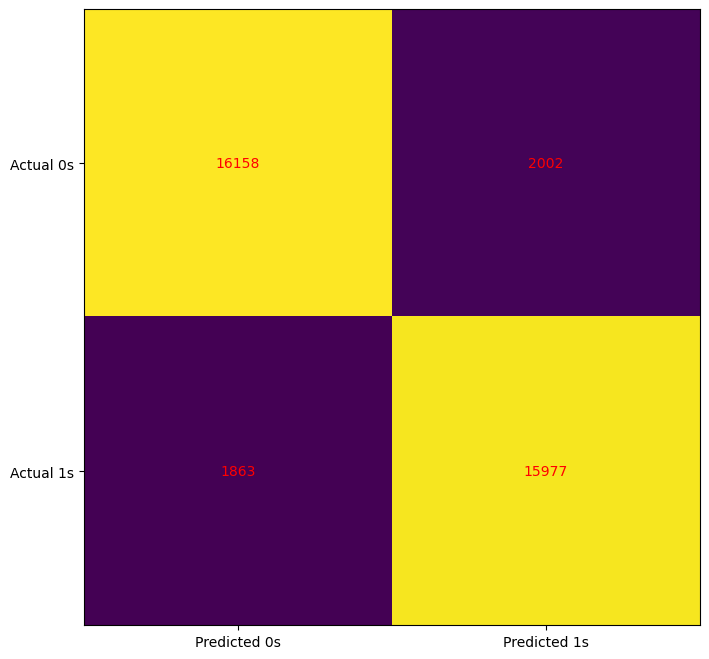

In [ ]:
confusion_matrix_plot(y_test,y_predict)

#Analyzing False Positive and False Negative

In [ ]:
from colorama import Fore, Back, Style
fn_dict={}
fp_dict={}
for i in range(0, len(y_test_list)):
    if ((y_test_list[i]=='0') & (y_predict_list[i]=='1')):
        fp_dict[i]=[test_list[i],rating_list[i]]
    elif((y_test_list[i]=='1') & (y_predict_list[i]=='0')):
        fn_dict[i]=[test_list[i],rating_list[i]]
    else:
        pass
    i+=1
for k,v in fp_dict.items():
    if v[1]<=2:
        print(Fore.RED +'False Positive: %s %s'%(k,v))
for k,v in fn_dict.items():
    if v[1]>=9:
        print(Fore.GREEN +'False Negative: %s %s'%(k,v))

False Positive: 15 ['good satire subtle scathing also helps immensely good satire funny mind choose watch film open mind retrospect touch ironic opening shiftless bum blow devil angel via soul well birther jibe movie subtlety brick face ok pj rourke not cut hour half later yes watched whole thing yes instantly regretted found not not laugh spent time dumbfounded inept movie interspersed numerous staged man streets interviews conservative libertarian rendered speechless ammo idiots say conservatives not funny needed site example example prove contrary point film forced say shucks got walk away', 2.0]
False Positive: 61 ['short non spoiler summary wake miscarriage problems couple moves los angeles troubled teenage daughter incredible deal get beautiful victorian home turns result past tragedies grounds house comes complete creepy intrusive neighbors mysterious housekeeper badness ensues categorize pilot american horror story unrelentingly unpleasant cynical fetishistic horror clearly fan

In [ ]:
#XAI: Explainable AI by Shap and LIME

In [ ]:
!pip install shap

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
#Explain Marginal Contribution of Features by Shap


import shap

shap.initjs()

In [ ]:
explainer = shap.Explainer(model_1, x_train_tfidf, feature_names=tfidfvect.get_feature_names_out())
shap_values = explainer(x_test_tfidf)


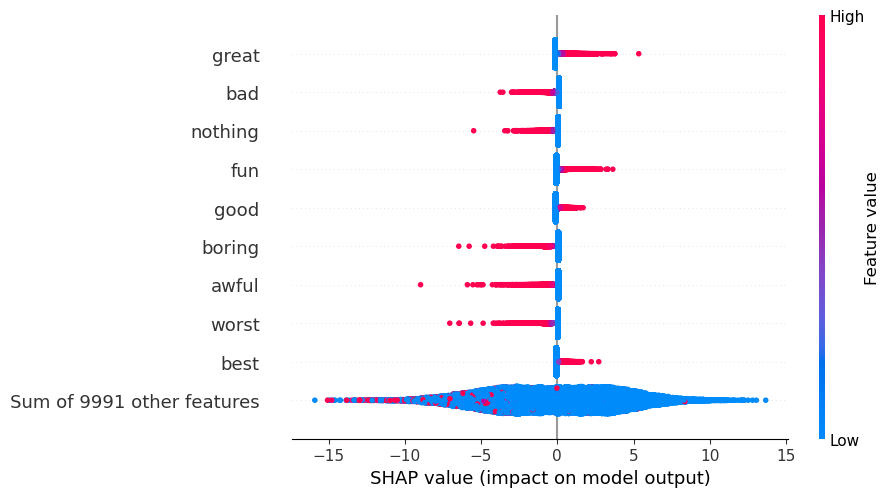

In [ ]:
shap.plots.beeswarm(shap_values)

In [ ]:
#Visualizing Marginal Contribution of Features

In [ ]:
ind = 4443
print('Probability Score %s' %y_predict_prob[ind])
shap.plots.force(shap_values[ind])

Probability Score 0.44040949943965274


In [ ]:
y_test_list=y_test.tolist()
print("Positive" if y_test_list[ind] else "Negative", "Review:")
print(test_list[ind])

Positive Review:
sorry not find movie funny many scenes believe cause offense others justified basis rented dvd skip lot content view see overall vote currently others agree still remember scenes regret seeing think make fun group not feeling anyway humble view believe many minorities easily offended not recommend anyone sad thing movie many good actresses actors not understand took part


In [ ]:
#Visualizing Marginal Contribution of Features for False Positive

In [ ]:
ind = 111
print('Probability Score %s' %y_predict_prob[ind])
shap.plots.force(shap_values[ind])

Probability Score 0.4012850564822616


In [ ]:
y_test_list=y_test.tolist()
print("Positive" if y_test_list[ind] else "Negative", "Review:")
print(test_list[ind])

Positive Review:
movie joke seriously anyone right mind think intended applied real life fictional joke something used part religion movie taken context many l ron hubbard wrote fictional movies books different war worlds entertainment piece written intention making people think weird crazy fictional ideas not turned religious cult watch movie feel sorry take seriously intended fictional entertainment not instructional video live


In [ ]:
#Visualizing Marginal Contribution of Features for False Negative

In [ ]:
ind = 7599
print('Probability Score %s' %y_predict_prob[ind])
shap.plots.force(shap_values[ind])

Probability Score 0.33338596942093385


In [ ]:
y_test_list=y_test.tolist()
print("Positive" if y_test_list[ind] else "Negative", "Review:")
print(test_list[ind])

Positive Review:
watched movie reading awful viewers plot little misunderstood people not get movie revolutionary innovative movie not made entertainment created sole purpose punishing mankind womankind ok sins outstanding job government utilize movie towards betterment society suggestion use drunk driving deterrent anybody get caught driving drunk punished forcing watch movie times safer roads time


In [ ]:
#Explain feature impact on Prediction by LIME

In [ ]:
idx=7599
output = model_2.predict([test_list[idx]])
print(output)

['0']


In [ ]:
!pip install lime

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283886 sha256=49f79c3a069087ff7244a1c372fbd88b8fa1f3198643f9e15b63eda3652a36c8
  Stored in directory: c:\users\lenovo\appdata\local\pip\cache\wheels\e7\5d\0e\4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
from lime.lime_text import LimeTextExplainer
class_names = [0,1]
explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(test_list[idx], model_2.predict_proba, num_features = 100,top_labels=2)
print('New document id: %d' % idx)
print('Predicted Label =', model_2.predict([test_list[idx]]))
print('Predicted probabilites =', model_2.predict_proba([test_list[idx]]))
print('Actual Label: %s' % y_test_list[idx])
print(exp.available_labels())

New document id: 7599
Predicted Label = ['0']
Predicted probabilites = [[0.68642064 0.31357936]]
Actual Label: 1
[0, 1]


In [ ]:
exp.show_in_notebook(text=True)

In [ ]:
exp.as_list(label=1)

[('drunk', -0.28131313820170367),
 ('awful', -0.24380788719501076),
 ('revolutionary', 0.18336246417612342),
 ('sole', -0.17287543799553434),
 ('driving', -0.14162948224913097),
 ('outstanding', 0.13993340194998785),
 ('misunderstood', 0.11006388083869777),
 ('innovative', 0.0990172989125337),
 ('entertainment', 0.08604956152454891),
 ('movie', 0.08149714092334528),
 ('ok', -0.05798326765926316),
 ('job', 0.056684704938779064),
 ('made', -0.056276037888991215),
 ('people', 0.05450915362595637),
 ('watch', 0.050665785290420665),
 ('government', 0.04323623227752491),
 ('caught', 0.0385499959795501),
 ('not', -0.035663827252709106),
 ('use', -0.03368808369465608),
 ('reading', -0.023282375469798226),
 ('suggestion', -0.02053117357010067),
 ('sins', -0.02031630116421098),
 ('created', 0.019126082407366764),
 ('watched', 0.0182996263856499),
 ('anybody', -0.017972799486218282),
 ('little', 0.017635963658382214),
 ('forcing', -0.01283451827254808),
 ('plot', -0.012807273350972969),
 ('time',

In [ ]:
#Explain feature impact on False Positive by LIME

In [ ]:
idx=111
exp = explainer.explain_instance(test_list[idx], model_2.predict_proba, num_features = 100,top_labels=2)
exp.show_in_notebook(text=True)

In [ ]:
#Explain feature impact on False Positive by LIME¶

In [ ]:
idx=24097
exp = explainer.explain_instance(test_list[idx], model_2.predict_proba, num_features = 100,top_labels=2)
exp.show_in_notebook(text=True)

In [ ]:
test=input()
exp = explainer.explain_instance(test, model_2.predict_proba, num_features = 100,top_labels=2)
exp.show_in_notebook(text=True)

### ✅ SHAP Explainability (Optional)

In [ ]:
import shap

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)
